# Look-Up Table

In [3]:
#!hide
from PIL import Image
import cv2
import os
def show(image):
    rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # BGR → RGB로 채널 순서 변경
    return Image.fromarray(rgb) # 객체 변환: 넘파이 배열 → PIL 형식으로
os.chdir('data')

자 그러면은 우리가 이제 계속 이어서 해보면 이번 시간에 해볼 것은 룩업 테이블을 이용한 색상 변환인데 룩업 테이블을 이용한 색상 변환은 뭐냐면 별건 아니고 아 룩업은 찾아본다는 거죠 테이블을 표고 찾아보기 표를 만들어서 예를 들면 우리가 이제 뭐 빨강은 뭐 회색으로 바꾸고 초록은 노랑은 분홍으로 바꾸고 주황은 파랑으로 바꾸고 뭐 이런식으로 미리 색깔을 정해놓는거에요

이 색은 이렇게 바꾸고 조색은 이렇게 바꾸고 그래서 그 우리가 이제 일반적인 영상 말고 뭐 뮤직비디오 나 이런데 보면 색깔이 굉장히 화려하고 약간 그 일반적인 색깔하고 다르게 사용을 하잖아요

그래서 그런거를 할 때도 룩업 테이블을 쓰기도 하구요

아니면은 우리가 이제 그 용량을 좀 줄이기 위해서 색깔을 원래는 우리가 이제 보면은 그 BGR에서 각각 0에서 255까지 색깔을 표현할 수 있으니까 실제로 컴퓨터에서 표현할 수 있는 색깔은 몇 개입니까

여기 888이니까 2의 24승까지 색깔을 표현을 할 수 있는 거거든요

그래서 그 표현할 수 있는 색깔이 굉장히 많은데 사실 우리가 이제 그러면 용량을 또 어떻게 많이 차지 하니까 색깔 수를 좀 줄여야 될 때가 있습니다

옛날 컴퓨터 게임 같은 거 보면 색깔을 별로 많이 쓰지 않거든요

옛날이라고 해도 벌써 굉장히 오래전인데 많아요.

그래서 옛날 컴퓨터 게임 같은 거 보면 색깔을 별로 많이 쓰지 않거든요

옛날이라고 해도 벌써 굉장히 오래전인데 많아요.

30년 전 컴퓨터 게임 같은 거 보면 색깔을 16색 이렇게 쓴단 말이에요

그래서 색깔 숫자를 좀 줄여 가지고 용량을 줄일 때 이런 방법들을 씁니다

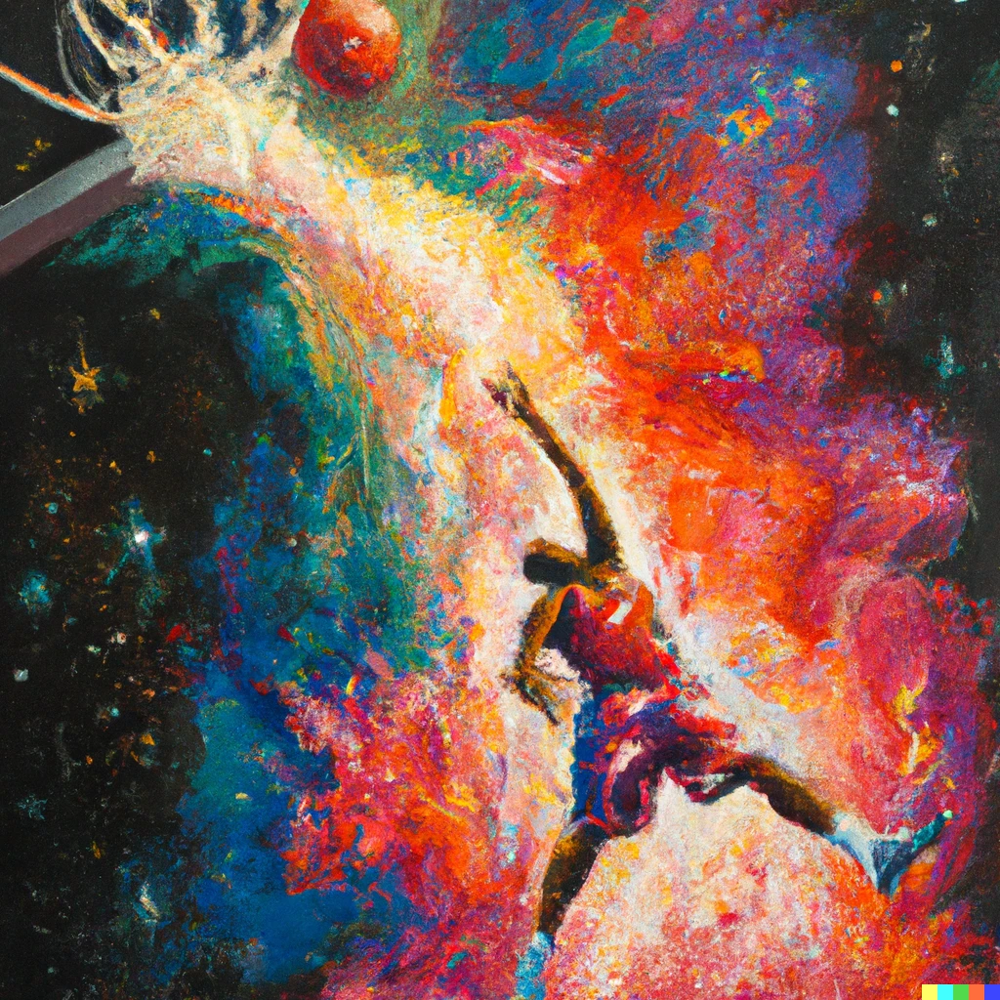

In [4]:
import numpy as np
import cv2
src = cv2.imread('basketball.webp')
show(src)

In [5]:
step_size = 64
lut = np.zeros(256, dtype=np.uint8) # 크기 256인 영벡터
for i in range(256):
    # step_size 만큼을 같은 값으로 채우고 0~255 범위를 넘지 않도록 클리핑
    lut[i] = np.clip(np.round(i / step_size) * step_size, 0, 255)
lut

array([  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,  64,  64,  64,  64,  64,  64,
        64,  64,  64,  64,  64,  64,  64,  64,  64,  64,  64,  64,  64,
        64,  64,  64,  64,  64,  64,  64,  64,  64,  64,  64,  64,  64,
        64,  64,  64,  64,  64,  64,  64,  64,  64,  64,  64,  64,  64,
        64,  64,  64,  64,  64,  64,  64,  64,  64,  64,  64,  64,  64,
        64,  64,  64,  64,  64, 128, 128, 128, 128, 128, 128, 128, 128,
       128, 128, 128, 128, 128, 128, 128, 128, 128, 128, 128, 128, 128,
       128, 128, 128, 128, 128, 128, 128, 128, 128, 128, 128, 128, 128,
       128, 128, 128, 128, 128, 128, 128, 128, 128, 128, 128, 128, 128,
       128, 128, 128, 128, 128, 128, 128, 128, 128, 128, 128, 128, 128,
       128, 128, 128, 128, 128, 192, 192, 192, 192, 192, 192, 192, 192,
       192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 192, 19

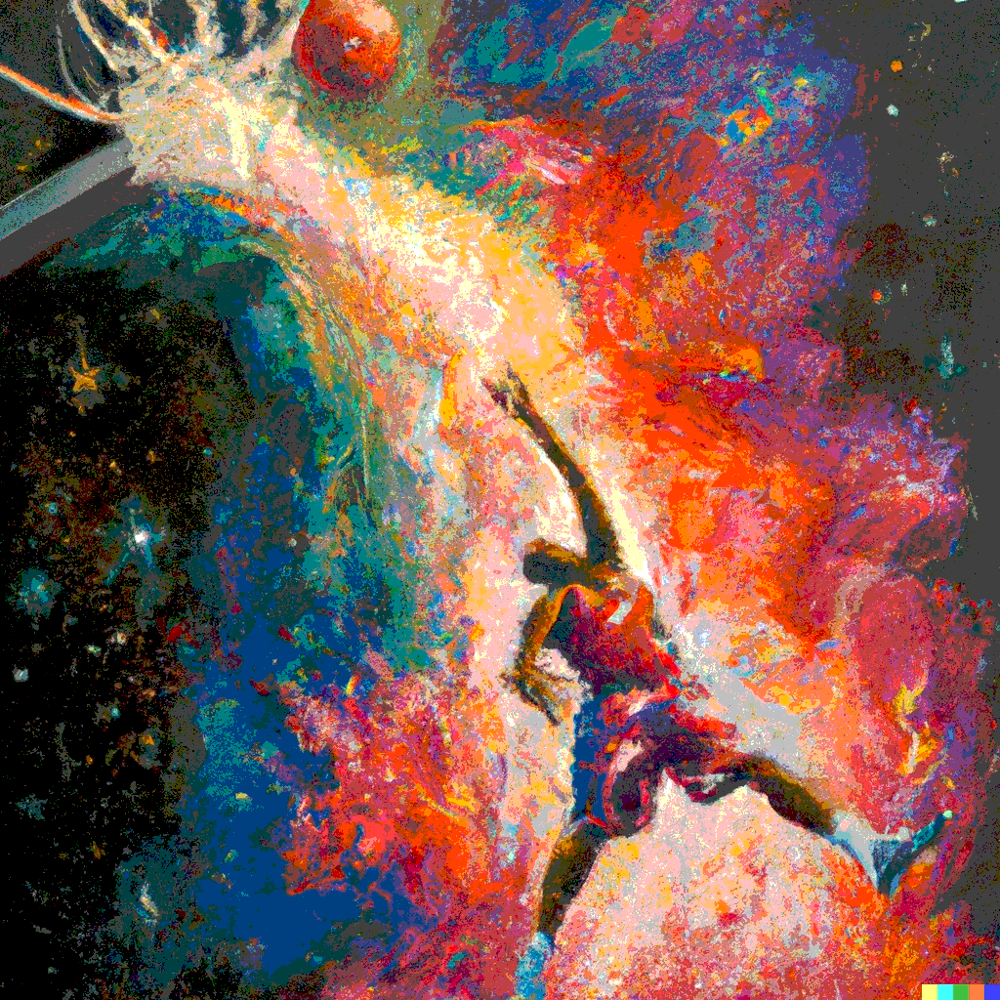

In [6]:
dst = cv2.LUT(src, lut) # lut 배열을 참고하여 각각의 색을 변환
show(dst)

그래서 여기 이제 Lookup Table은 코드를 보시면 여기 LUT라는 표가 있는데 이 표를 가지고 색깔을 미리 지정을 해 두는 거예요

그래서 이거를 한번 어떻게 되는지 한번 해 보면 여기 이제 NameNP is not defined 이렇게 돼 있는데 이거는 우리 강의 자료 앞에 있었던 아 import numPy를 넣어 주시면 됩니다

그래서 이제 Show DST 해 보면 보면은 원본하고의 차이를 보면은 원본은 Show SLC 해 보면 원본은 이제 이런 그림인데 이거를 여기 지금 DST를 보면은 색깔이 몇 개 없어 가지고 그림이 이제 약간 얼룩덜룩하게 나오거든요

차이가 보이시죠


그래서 왜 이렇게 얼룩덜룩하게 보이느냐

우리가 이 LUT를 만들 때 그 색깔을 64개씩 뭉쳐 가지고 하나의 색깔로 만들어 버렸어요

그래서 LUT를 만들 때 색깔을 64개씩 뭉쳐 가지고 하나의 색깔로 만들어 버렸어요

그래서 LUT를 만들 때 색깔을 64개씩 뭉쳐 가지고 하나의 색깔로 만들어 버렸어요

LUT 값을 보시면은 여기 보시면은 원래는 0, 1, 2, 3, 4 이렇게 가야 되는데 그냥 다 0, 0, 0, 0, 0, 0, 0, 0, 0 해서 0부터 63까지는 전부 0으로 바꿔 버렸습니다

그래서 이제 이 단계의 색은 다 똑같은 색이 돼 버린 거죠

그 다음에 64부터 127까지도 우리가 그냥 다 64로 뭉쳐 버렸어요

그래서 이런 식으로 미리 색을 우리가 이제 뭉쳐 놨기 때문에 색깔의 개수가 줄어들어서 이렇게 된 거죠

그래서 이제 이런 식으로 하면은 우리가 이제 약간 후처리를 더해주면은 파일 용량 같은 거를 굉장히 많이 줄일 수가 있습니다

왜냐하면 우리가 이렇게 하면은 255개의 색깔을 쓰는 게 아니고 보시면은 하나, 둘, 셋, 넷, 다섯 다섯 단계의 색상만 쓰는데 BGR이니까 5에 3승 해서 뭐 해봐요 125개의 색깔로 이 그림을 나타낼 수 있는 거죠

지금은 이제 그림이 크니까 이게 그, 색깔이 단계 수가 적은 게 티가 나는데 이 그림을 작게 축소를 하면은 사실 지금 보시면은 별 차이를 못 느낀단 말이에요

색깔 수가 적어도 그래서 색깔 수를 이제 이런 식으로 LUT를 이용해서 줄일 수도 있고 그래서 뭐 색깔 수를 줄일 때만 쓰는 게 아니고 예를 들면은 우리가 앞에서 이제 특정 대역의 색깔만 보고 싶다던가 이럴 때 처리를 해 주는데 그렇게 하지 않고 미리 LUT를 만들어 가지고 내가 원하는 대역의 색깔만 뭐 흰색으로 바꾸고 이제 이진화 같은 거 할 때도 쓸 수 있죠


사실 여기 이제 코드가 되게 긴데 대부분이 여기 가운데 있는 다섯 줄은 LUT를 그냥 만드는 부분이고 LUT를 꼭 이렇게 만드셔야 되는 건 아니고 여러분 원하시는 대로 뭐 만드셔도 됩니다

손으로 직접 짜도 되고요 그러니까 뭐 예를 들어서 나는 0은 뭐 250으로 바꾸고 뭐 이렇게 하고 싶다던가 뭐 LUT를 이제 그거는 마음대로 만드시면 되는 거고 LUT 적용은 이렇게 하시면 됩니다


그래서 보시면은 지금 이런 영상을 편집을 하고 풍경 영상을 편집하고 있는데 그냥 우리가 보통 유튜브 하면 그냥 뭐 이렇게 카메라 대충 찍어 가지고 올리면 되지만 예를 들면 좀 예술 영상 같은 거 찍는 분들은 예를 들어서 이분 같은 경우는 이렇게 약간 쨍한 색감을 내고 싶은 거죠 쨍한 색감을 내고 싶으면 흐리멍텅한 색깔을 다 LUT에서 쨍한 색으로 다 옮겨 놓으면 됩니다 표를 만들어 가지고 이 색깔은 여기로 바꾸고 이 색깔은 여기로 바꾸고 이런 식으로 해서 영상 편집하는 분들이 LUT라고 하는데 색 보정할 때 수동으로 정말 하나하나 색을 다 이렇게 맵핑을 해 놓는 거예요

## 감마 보정

In [7]:
lut = np.zeros(256, dtype=np.uint8)
gamma = 0.5
for i in range(256):
    lut[i] = np.power(i/255.0, gamma) * 255.
lut

array([  0,  15,  22,  27,  31,  35,  39,  42,  45,  47,  50,  52,  55,
        57,  59,  61,  63,  65,  67,  69,  71,  73,  74,  76,  78,  79,
        81,  82,  84,  85,  87,  88,  90,  91,  93,  94,  95,  97,  98,
        99, 100, 102, 103, 104, 105, 107, 108, 109, 110, 111, 112, 114,
       115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127,
       128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140,
       141, 141, 142, 143, 144, 145, 146, 147, 148, 148, 149, 150, 151,
       152, 153, 153, 154, 155, 156, 157, 158, 158, 159, 160, 161, 162,
       162, 163, 164, 165, 165, 166, 167, 168, 168, 169, 170, 171, 171,
       172, 173, 174, 174, 175, 176, 177, 177, 178, 179, 179, 180, 181,
       182, 182, 183, 184, 184, 185, 186, 186, 187, 188, 188, 189, 190,
       190, 191, 192, 192, 193, 194, 194, 195, 196, 196, 197, 198, 198,
       199, 200, 200, 201, 201, 202, 203, 203, 204, 205, 205, 206, 206,
       207, 208, 208, 209, 210, 210, 211, 211, 212, 213, 213, 21

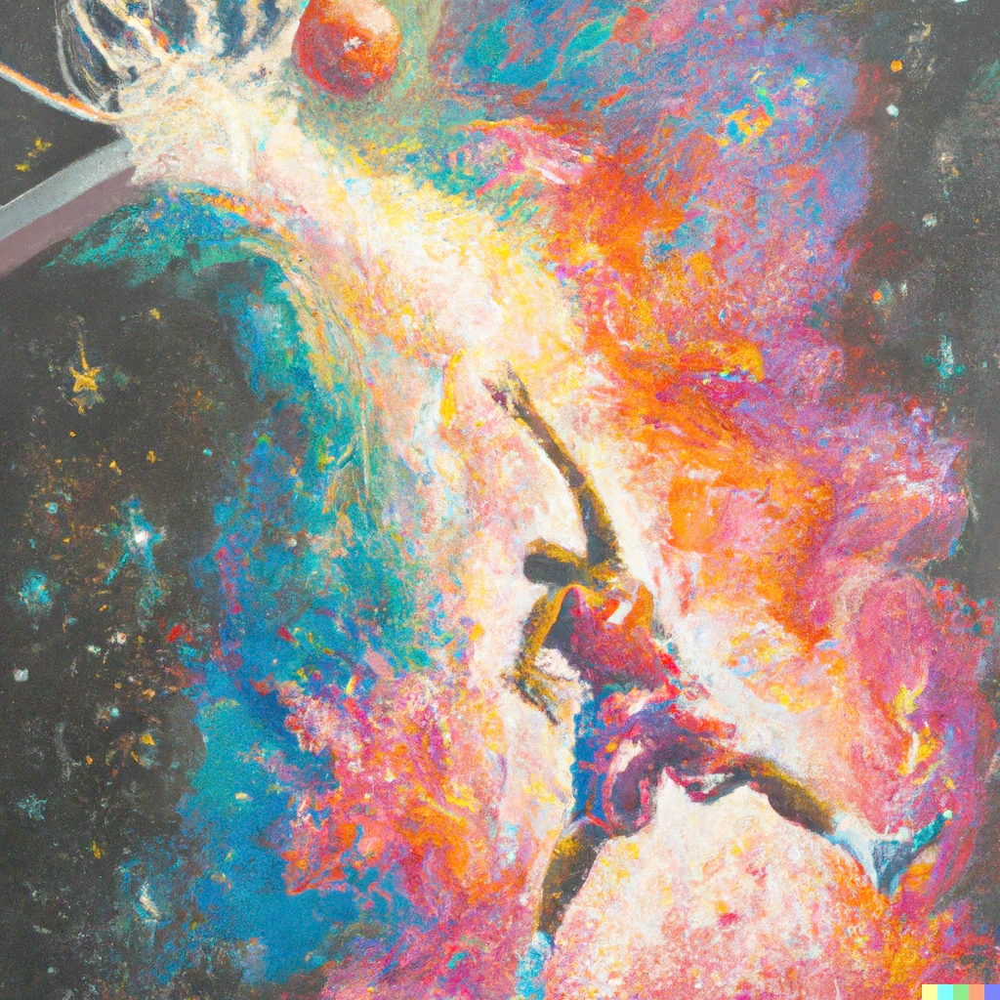

In [8]:
dst = cv2.LUT(src, lut)
show(dst)

In [9]:
lut = np.zeros(256, dtype=np.uint8)
gamma = 2.0
for i in range(256):
    lut[i] = np.power(i/255.0, gamma) * 255.
lut


array([  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   1,   1,   1,   1,   1,   1,   1,   2,   2,   2,
         2,   2,   3,   3,   3,   3,   4,   4,   4,   4,   5,   5,   5,
         5,   6,   6,   6,   7,   7,   7,   8,   8,   9,   9,   9,  10,
        10,  11,  11,  11,  12,  12,  13,  13,  14,  14,  15,  15,  16,
        16,  17,  17,  18,  18,  19,  19,  20,  20,  21,  22,  22,  23,
        23,  24,  25,  25,  26,  27,  27,  28,  29,  29,  30,  31,  31,
        32,  33,  33,  34,  35,  36,  36,  37,  38,  39,  40,  40,  41,
        42,  43,  44,  44,  45,  46,  47,  48,  49,  50,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  79,
        80,  81,  82,  83,  84,  85,  87,  88,  89,  90,  91,  93,  94,
        95,  96,  97,  99, 100, 101, 102, 104, 105, 106, 108, 109, 110,
       112, 113, 114, 116, 117, 118, 120, 121, 122, 124, 125, 12

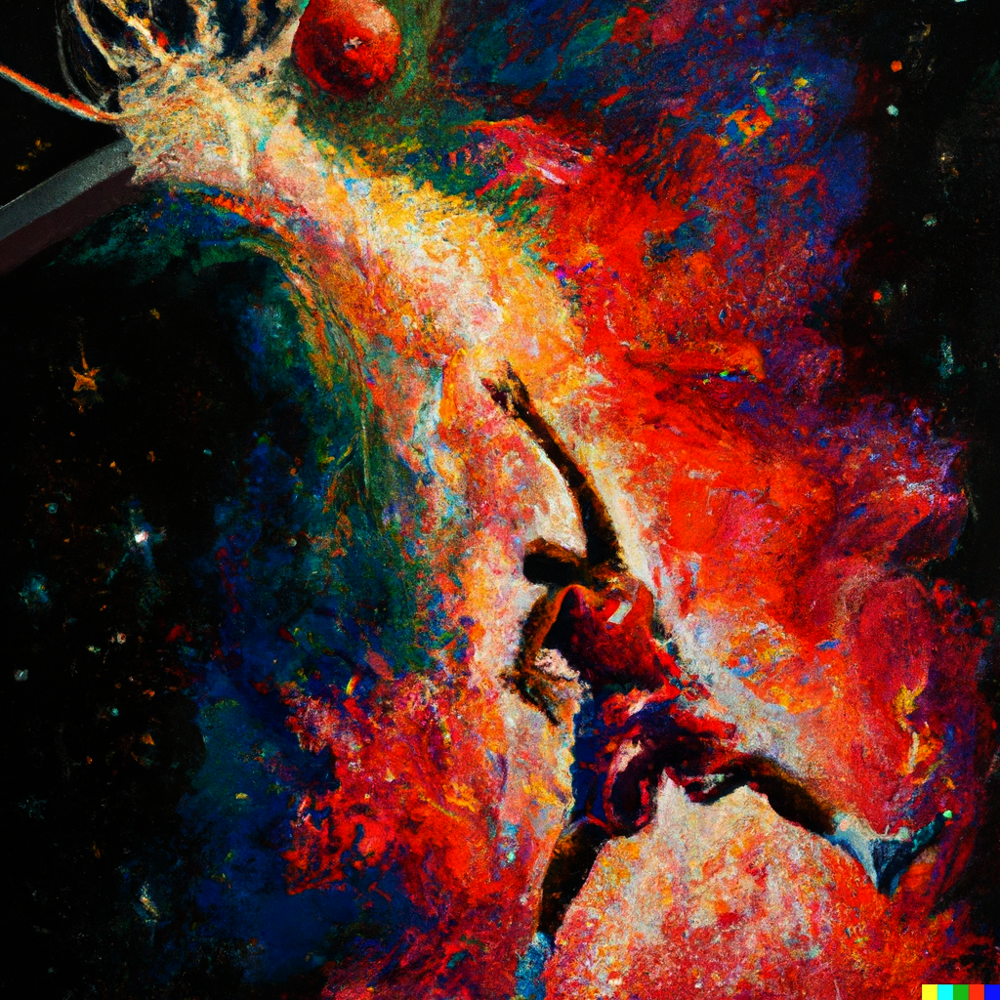

In [10]:
dst = cv2.LUT(src, lut)
show(dst)


세로축이 바뀐 밝기인데 모니터 같은 데 보면 감마 라는 모니터 설정에 들어가 보시면 감마 라는 값이 있어요.

이게 뭐냐면 어떤 수학적 함수를 써 가지고 그 수학적 함수에서 감마를 어떻게 설정하냐에 따라서 이 함수의 커브가 달라집니다.

감마가 1이면은 이렇게 생긴 커브가 되고요.

직선이 되는 거죠.

감마가 1인 경우에는 실제 밝기랑 바뀐 밝기가 똑같아요.

1대1 대 0이기 때문에 근데 감마를 키워주면은 그래프가 아래로 이렇게 휘고요.

감마를 줄여주면은 그래프가 이렇게 위로 휩니다.

그래프가 위로 휘면 어떻게 되느냐

이렇게 위로 휘면 어떻게 되냐면 어두운 거는 확 밝아지는데 밝은 거는 별로 안 밝아져요.

그래서 감마를 낮춘다는 거는 어두운 부분의 밝기를 확 키워줘라

이런 얘기가 됩니다.

반대로 감마를 키워주면 어떻게 될까요?

그래프가 이렇게 확 내려가니까 여기 되게 밝았는데 어두워지겠죠.

그래서 밝기가 다르게 돼요.

그래서 이제 우리가 이미지를 가지고 픽셀 단위로 다 계산을 따로따로 할 수도 있고 아니면은 이것도 러스로 만들어 가지고 미리 이 방법을 만들어서 저 밝기는 이렇게 바꿔라

저 밝기는 저렇게 바꿔라

이거를 미리 해 놓으면 일일이 계산을 반복을 할 필요가 있겠죠.

미리 다 계산을 해 가지고 러스로 만들어 LUT로 만들어 놨으니까 그래서 이것도 이제 한번 해 보면 ...

... 일단은 이제 감마가 0.5일 때 럿을 보면 LUT를 보면 지금 0.5니까는 어두운 데를 밝게 하겠죠.

원래는 밝기가 0 1 2 3 4 이렇게 올라가는데 0은 그대로 0이고 1이 15로 튀어 오르고 2는 22로 튀어 오르고 3은 27로 튀어 오르고 자기보다 실제 밝기보다 10배씩 밝기가 올라갔죠.

... 근데 이제 뒤로 가면 원래 255 였던 것은 255고 254 였던 것은 254고 253 이었던 데는 253이고 그러니까 밝은 부분은 밝기가 별로 차이가 없어요 어두운 부분이 확 밝아지는 이런식으로 럿을 미리 만들어 놓습니다

그래 놓고 이미지에다가 적용을 해주면 되겠죠

그러면은 지금 보시면 이미지가 전반적으로 굉장히 밝게 보이는데 밝게 보이는게 아니고 사실은 어두운 부분에 밝기를 올린 거죠

밝은 부분은 놔두고 그 다음에 이제 우리가 여기 감마가 0.5 인데 감마를 이제 2.0 으로 바꿨다

그러면 럿을 보면 0도 0이고 1도 0이고 2도 0이고 3도 0이고 4도 0이고 5도 0이고 어두운 부분은 확 어둡게 된거죠

그리고 중간까지도 계속 그렇다가 이제 밝은 부분만 밝기 차이를 많이 두게 됩니다

그래서 감마를 높인 다음에 다시 결과를 보면은 어두운 부분들 이런데 까만 데는 확 어두워 졌죠

그리고 이제 밝은 데에만 더 밝기를 놔두게 됩니다

이렇게 감마 보정을 하면은 우리가 앞에서 이제 전반적으로 밝기 보정 하는 거랑은 좀 달라요

전반적으로 밝기 보정하는 것은 더하기 100 이러면은 모든 픽셀의 밝기를 다 100만큼 올려주는 거죠

어 어 그래도 약간 감마 보정 하고 비슷할 수 있는데 왜냐하면 은 이제 255 보다 더 밝아지지 않으니까 약간 요거랑 좀 비슷한 효과가 생기긴 생기는 거죠

근데 그래프가 이제 이렇게 매끄럽게 변하는 게 아니고 전반적으로 밝기를 올리면 그냥 그래프가 요렇게 되겠죠

여기서 천정에 막히니까 이런식으로 그래서 이제 이렇게 하는 것은 전반적으로 밝기를 올리는 거고 감마 보정을 하면 이런 그래프로 올리는 거고 뭐 아니면 우리가 이제 히스토그램 균일화를 하면은 아 이런식으로 이렇게 매끈한 곡선으로 라는게 아니라 어두운 데를 찾아 가지고 거기를 올리는 거죠

이렇게 한거고 그 다음에 감마 보정은 어떤 수학적 함수로 수학적 함수를 이용을 해서 하는 건데 아 이걸 반드시 넣어 수로 할 필요는 없습니다

왜냐하면 점마다 다 따로 계산하면 되거든요

근데 이제 러스 를 만들어 놓으면 매번 계산할 필요 없이 미리 표로 만들어 났으니까 일괄적으로 변환을 해 주면 되는거죠